## Double pendulum using Lagrange's equations

For a double pendulum, the Lagrangian with generalized coordinate $\phi_{1}$, $\phi_{2}$ is

$\begin{align} \tag{1}
  T = \frac12(m_1+m_2){L_1}^2 \dot\phi_{1}^2 + m_2 L_1 L_2 \dot\phi_{1} \dot\phi_{2} \cos(\phi_{1} - \phi_{2}) + \frac12 m_2{L_2}^2 \dot\phi_{2}^2
\end{align}$

$\begin{align} \tag{2}
  U = -[(m_1+m_2) g {L_1} \cos \phi_{1} + m_2 g {L_2} \cos \phi_{2}]
\end{align}$

Substitute $T$ and $U$ into the Lagrangian $\mathcal{L} = T-U $

\begin{equation} \tag{3}
  \begin{aligned} 
    {} &\mathcal{L} = T-U \\
    & = \frac12(m_1+m_2){L_1}^2 \dot\phi_{1}^2 + m_2 L_1 L_2 \dot\phi_{1} \dot\phi_{2} \cos(\phi_{1} - \phi_{2})
    + \frac12 m_2{L_2}^2 \dot\phi_{2}^2  + (m_1+m_2) g {L_1} \cos \phi_{1} + m_2 g {L_2} \cos \phi_{2} 
  \end{aligned}
\end{equation}

Generalized momentums are

$\begin{align} \tag{4}
   p_{\phi_{1}} = \frac{\partial\mathcal{L}}{\partial \dot\phi_{1}} = (m_1+m_2){L_1}^2 \dot\phi_{1} + m_2 L_1 L_2 \dot\phi_{2} \cos(\phi_{1} - \phi_{2})
   \;.
\end{align}$

$\begin{align} \tag{5}
   p_{\phi_{2}} = \frac{\partial\mathcal{L}}{\partial \dot\phi_{2}} = m_2{L_2}^2 \dot\phi_{2} + m_2 L_1 L_2 \dot\phi_{1} \cos(\phi_{1} - \phi_{2})
   \;.
\end{align}$

 Euler-Lagrange equations

$\begin{align} \tag{6}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot\phi_{1}} = \frac{\partial\mathcal L}{\partial\phi_{1}}
 \quad\Longrightarrow\quad
 & (m_1 + m_2) L_1^2 \ddot\phi_{1} + m_2 L_1 L_2 \ddot\phi_{2} \cos(\phi_{1} - \phi_{2}) + m_2 L_1 L_2 \dot\phi_{2}^2 \sin(\phi_{1} - \phi_{2}) \\
 & = -(m_1 + m_2) g L_1 \sin(\phi_1)
\end{align}$

$\begin{align} \tag{7}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot\phi_{2}} = \frac{\partial\mathcal L}{\partial\phi_{2}}
 \quad\Longrightarrow\quad
 & m_2 L_1^2 \ddot\phi_{2} + m_2 L_1 L_2 \ddot\phi_{2} \cos(\phi_{1} - \phi_{2}) - m_2 L_1 L_2 \dot\phi_{1}^2 \sin(\phi_{1} - \phi_{2}) \\
 & = -m_2 g L_2 \sin(\phi_2)
\end{align}$


In [1]:
%matplotlib inline

In [2]:
import numpy as np
from scipy.integrate import odeint, solve_ivp

import matplotlib.pyplot as plt

## Pendulum Class

$\begin{align} \tag{8}
\ddot{\phi_1}  &= \frac{m_2 g \sin(\phi_2) \cos(\phi_1-\phi_2) - m_2 \sin(\phi_1-\phi_2) (L_1 \cos(\phi_1-\phi_2) \dot{\phi_1}^2 + L_2 \dot{\phi_2}^2) - (m_1+m_2)g \sin(\phi_1)}{L_1 (m_1+m_2 \sin(\phi_1-\phi_2)^2) }
\end{align}$

$\begin{align} \tag{9}
\ddot{\phi_2} &= \frac{(m_1+m_2) (L_1 \dot{\phi_1}^2 \sin(\phi_1-\phi_2) - g \sin(\phi_2) + g \sin(\phi_1) \cos(\phi_1-\phi_2)) + m_2 L_2 \dot{\phi_2}^2 \cos(\phi_1-\phi_2) \sin(\phi_1-\phi_2)}{L_2 (m_1+m_2 \sin(\phi_1-\phi_2)^2)}
\end{align}$

In [3]:
class DoubleLagrangianPendulum():
    def __init__(self, L1, L2, m1, m2, g):
        self.L1 = L1
        self.L2 = L2
        self.m1 = m1
        self.m2 = m2
        self.g = g

    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dphi1/dt dphi2/dt d^2phi1/dt^2 d^2phi2/dt^2]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            A 2-component vector with y[0] = phi1(t) and y[1] = phi2(t)
                                      y[2] = dphi1/dt and y[3] = dphi2/dt
            
        Returns
        -------
        
        """
        phi1, phi1_dot, phi2, phi2_dot = y
        m1 = self.m1
        m2 = self.m2
        L1 = self.L1
        L2 = self.L2
        g = self.g
        # d^2phi1/dt^2
        p1_u = ( m2*g*np.sin(phi2)*np.cos(phi1-phi2) - m2*np.sin(phi1-phi2)*(L1*np.cos(phi1-phi2) *phi1_dot**2 + L2*phi2_dot**2) - (m1+m2)*g*np.sin(phi1)) 
        p1_l = L1*(m1+m2*np.sin(phi1-phi2)**2)
        phi1_ddot = p1_u/p1_l
        # d^2phi2/dt^2
        p2_u = ((m1+m2)*(L1*phi1_dot**2*np.sin(phi1-phi2) - g*np.sin(phi2) + g*np.sin(phi1)*np.cos(phi1-phi2)) + m2*L2*phi2_dot**2*np.cos(phi1-phi2)*np.sin(phi1-phi2))
        p2_l = L2 *(m1+m2*np.sin(phi1-phi2)**2)
        phi2_ddot = p2_u/p2_l

        return phi1_dot, phi1_ddot, phi2_dot, phi2_ddot

    def solve_ode(self, t_pts, phi1_0, phi1_dot_0, phi2_0, phi2_dot_0, 
                  abserr=1.0e-9, relerr=1.0e-9):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [phi1_0, phi1_dot_0, phi2_0, phi2_dot_0] 
        # solution = odeint(self.dy_dt, y, t_pts, atol=abserr, rtol=relerr)
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, 
                             atol=abserr, rtol=relerr)
        phi1, phi1_dot, phi2, phi2_dot = solution.y

        return phi1, phi1_dot, phi2, phi2_dot

In [4]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [5]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

In [6]:
# Common plotting time (generate the full time then use slices)
t_start = 0.
t_end = 400.
delta_t = 0.05

t_pts = np.arange(t_start, t_end + delta_t, delta_t)

# Instantiate a pendulum 
L1=2.
L2=1.
m1=1.
m2=1.
g=1.
dp1 = DoubleLagrangianPendulum(L1=L1, L2=L2, m1=m1, m2=m2, g=g)

phi1_0 = np.pi/2
phi1_dot_0 = 0.
phi2_0 = np.pi
phi2_dot_0 = 0.
phi1, phi1_dot, phi2, phi2_dot = dp1.solve_ode(t_pts, phi1_0, phi1_dot_0, phi2_0, phi2_dot_0)
phi1_s, phi1_dot_s, phi2_s, phi2_dot_s = dp1.solve_ode(t_pts, phi1_0, phi1_dot_0, phi2_0+0.00001, phi2_dot_0)

# Plot Double Pendulum $\phi$ vs $t$

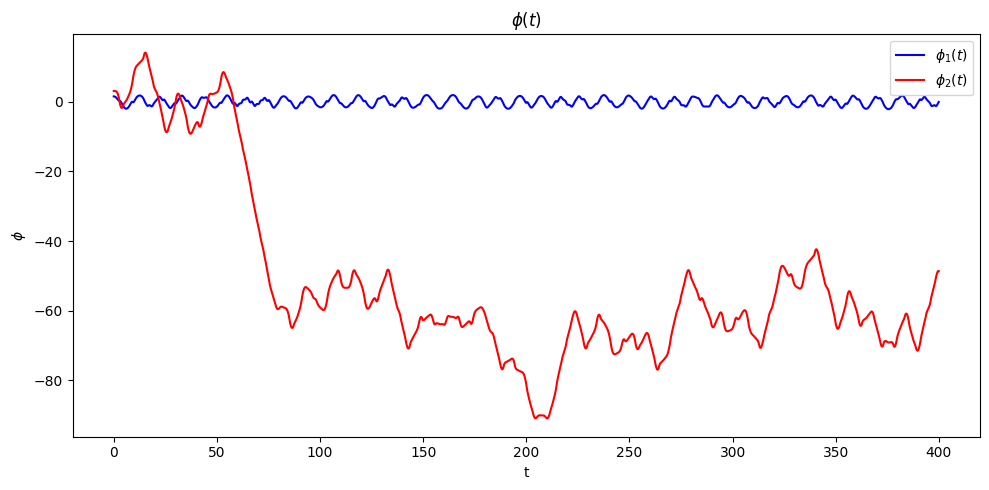

In [7]:
# start the plot!
fig = plt.figure(figsize=(10,5))
    
# first plot: phi plot 
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
ax_a.plot(t_pts[start : stop], phi1[start : stop], color='blue',label=r'$\phi_1(t)$')    
ax_a.plot(t_pts[start : stop], phi2[start : stop], color='red',label=r'$\phi_2(t)$')    
ax_a.set_title(r'$\phi(t)$')
ax_a.set_xlabel('t')
ax_a.set_ylabel(r'$\phi$')
ax_a.legend()

fig.tight_layout()
# fig.savefig('simple_pendulum_Lagrange.png', bbox_inches='tight')

## Interactive Widgets

In [8]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox, Layout, Tab, Label, Checkbox
from ipywidgets import FloatSlider, IntSlider, Play, Dropdown, HTMLMath 
from IPython.display import display

In [9]:
def update_plot(L1, L2, m1, m2, g):
    # Common plotting time (generate the full time then use slices)
    t_start = 0.
    t_end = 100.
    delta_t = 0.05

    t_pts = np.arange(t_start, t_end + delta_t, delta_t)

    # Instantiate a pendulum 
    dp1 = DoubleLagrangianPendulum(L1=L1, L2=L2, m1=m1, m2=m2, g=g)

    phi1_0 = np.pi/2
    phi1_dot_0 = 0.
    phi2_0 = np.pi
    phi2_dot_0 = 0.
    phi1, phi1_dot, phi2, phi2_dot = dp1.solve_ode(t_pts, phi1_0, phi1_dot_0, phi2_0, phi2_dot_0)
    phi1_s, phi1_dot_s, phi2_s, phi2_dot_s = dp1.solve_ode(t_pts, phi1_0, phi1_dot_0, phi2_0+0.00001, phi2_dot_0)
    # start the plot!
    fig = plt.figure(figsize=(10,5))
    
    # first plot: phi plot 
    ax_a = fig.add_subplot(1,1,1)                  

    start, stop = start_stop_indices(t_pts, t_start, t_end)    
    ax_a.plot(t_pts[start : stop], phi1[start : stop], color='blue',label=r'$\phi_1(t)$')    
    ax_a.plot(t_pts[start : stop], phi2[start : stop], color='red',label=r'$\phi_2(t)$')    
    ax_a.set_title(r'$\phi(t)$')
    ax_a.set_xlabel('t')
    ax_a.set_ylabel(r'$\phi$')
    ax_a.legend()

    fig.tight_layout()
    # fig.savefig('simple_pendulum_Lagrange.png', bbox_inches='tight')

In [10]:
m1 = FloatSlider(value=1., min=1., max=100., step=1.,
                      description='m1:')
m2 = FloatSlider(value=1., min=1., max=100., step=1.,
                      description='m2:')
L1 = FloatSlider(value=1., min=1., max=100., step=1.,
                      description='L1:')
L2 = FloatSlider(value=1., min=1., max=100., step=1.,
                      description='L2:')
g = FloatSlider(value=1., min=1., max=30., step=0.3,
                      description='g:')

plot_out = widgets.interactive_output(update_plot, dict(m1=m1, m2=m2, L1=L1, L2=L2, g=g))

In [11]:
UI_box = VBox([m1, m2, L1, L2, g, plot_out])
display(UI_box)

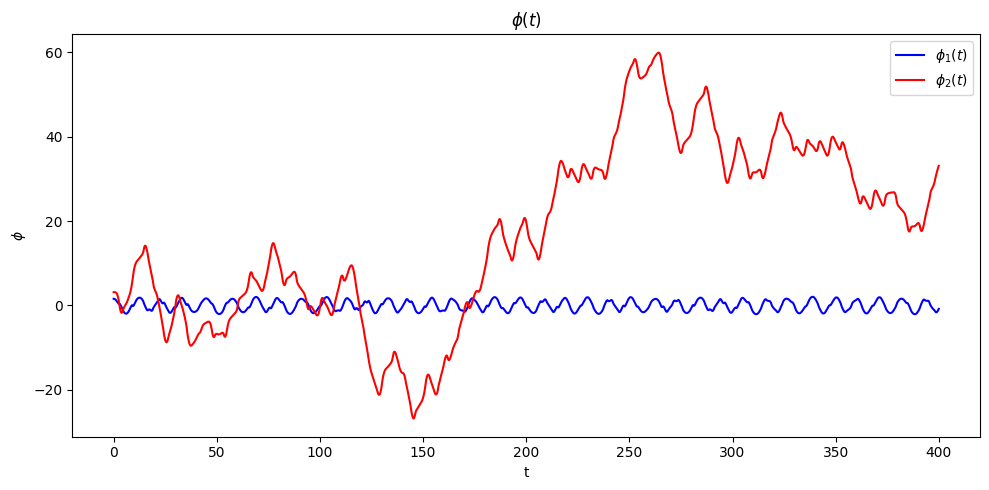

In [12]:
# start the plot!
fig = plt.figure(figsize=(10,5))
    
# first plot: phi plot 
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
ax_a.plot(t_pts[start : stop], phi1_s[start : stop], color='blue',label=r'$\phi_1(t)$')    
ax_a.plot(t_pts[start : stop], phi2_s[start : stop], color='red',label=r'$\phi_2(t)$')    
ax_a.set_title(r'$\phi(t)$')
ax_a.set_xlabel('t')
ax_a.set_ylabel(r'$\phi$')
ax_a.legend()

fig.tight_layout()
fig.savefig('simple_pendulum_Lagrange.png', bbox_inches='tight')  

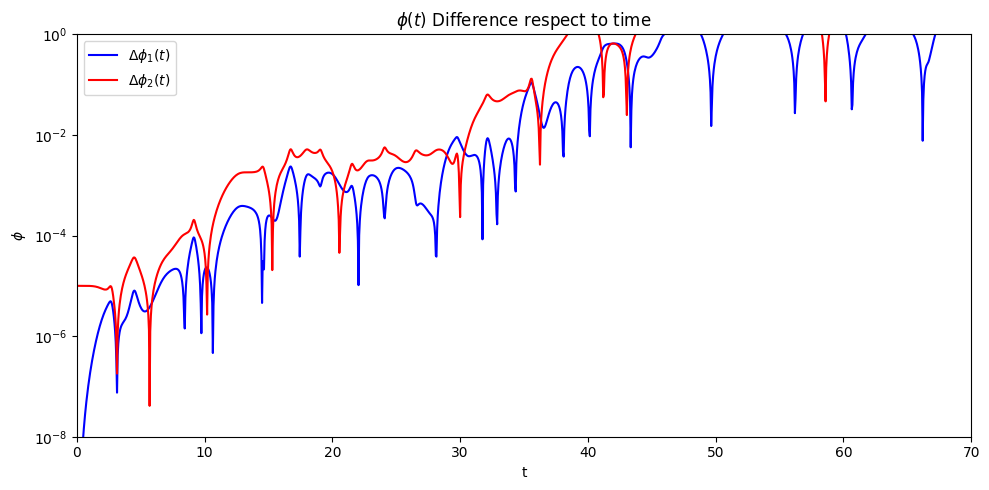

In [13]:
# start the plot!
fig = plt.figure(figsize=(10,5))
    
# first plot: phi plot 
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], np.abs(phi1_s[start : stop]-phi1[start : stop]), color='blue',label=r'$\Delta\phi_1(t)$',semilogy=True,ax=ax_a)    
plot_y_vs_x(t_pts[start : stop], np.abs(phi2_s[start : stop]-phi2[start : stop]), color='red',label=r'$\Delta\phi_2(t)$',semilogy=True,ax=ax_a)    
ax_a.set_title(r'$\phi(t)$' + " Difference respect to time")
ax_a.set_xlabel('t')
ax_a.set_xlim(0,70)
ax_a.set_ylim(1.e-8,1)
ax_a.set_ylabel(r'$\phi$')
ax_a.legend()

fig.tight_layout()
fig.savefig('simple_pendulum_Lagrange.png', bbox_inches='tight')  

We can see from the graph shown above, the difference between two pandulums exponentially increase as time increase, which means the small angle have a significant effect on the pendulum motion.

# Animating Double Pendulum

In [14]:
from matplotlib import animation, rc
from IPython.display import HTML

In [15]:
def xy_coords(x0, y0, theta, L):
    x = x0 + L * np.sin(theta)
    y = y0 - L * np.cos(theta)
    return x, y

In [16]:
%%capture
x_min = -3.2
x_max = -x_min
y_min = -3.2
y_max = -y_min

fig_anim = plt.figure(figsize=(5, 5), num='Double Pendulum')
ax_anim = fig_anim.add_subplot(1, 1, 1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

x0, y0 = 0., 0.
pt0_anim, = ax_anim.plot(x0, y0, 'o', markersize=6, color='black')

x1, y1 = xy_coords(x0, y0, phi1[0], dp1.L1)
pt1_anim, = ax_anim.plot(x1, y1, 'o', markersize=12, color='blue')
ln1_anim, = ax_anim.plot([x0, x1], [y0, y1], color='blue', lw=3)

x2, y2 = xy_coords(x1, y1, phi2[0], dp1.L2)
pt2_anim, = ax_anim.plot(x2, y2, 'o', markersize=12, color='blue')
ln2_anim, = ax_anim.plot([x1, x2], [y1, y2], color='blue', lw=3)

x1_s, y1_s = xy_coords(x0, y0, phi1_s[0], dp1.L1)
pt1_anim_s, = ax_anim.plot(x1_s, y1_s, 'o', markersize=12, color='red')
ln1_anim_s, = ax_anim.plot([x0, x1_s], [y0, y1_s], color='red', lw=3)

x2_s, y2_s = xy_coords(x1_s, y1_s, phi2_s[0], dp1.L2)
pt2_anim_s, = ax_anim.plot(x2_s, y2_s, 'o', markersize=12, color='red')
ln2_anim_s, = ax_anim.plot([x1_s, x2_s], [y1_s, y2_s], color='red', lw=3)

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [17]:
def animate_pendulum(i):
    i_skip = 2 * i

    x0, y0 = 0., 0.
    pt0_anim.set_data(x0, y0)

    x1, y1 = xy_coords(x0, y0, phi1[i_skip], dp1.L1)
    pt1_anim.set_data(x1, y1)
    ln1_anim.set_data([x0, x1], [y0, y1])

    x2, y2 = xy_coords(x1, y1, phi2[i_skip], dp1.L2)
    pt2_anim.set_data(x2, y2)
    ln2_anim.set_data([x1, x2], [y1, y2])

    x1_s, y1_s = xy_coords(x0, y0, phi1_s[i_skip], dp1.L1)
    pt1_anim_s.set_data(x1_s, y1_s)
    ln1_anim_s.set_data([x0, x1_s], [y0, y1_s])

    x2_s, y2_s = xy_coords(x1_s, y1_s, phi2_s[i_skip], dp1.L2)
    pt2_anim_s.set_data(x2_s, y2_s)
    ln2_anim_s.set_data([x1_s, x2_s], [y1_s, y2_s])

    return (pt0_anim, pt1_anim, ln1_anim, pt2_anim, ln2_anim, pt1_anim_s, ln1_anim_s, pt2_anim_s, ln2_anim_s)

frame_interval = 20  # time between frames
frame_number = 1001   # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_anim, 
                               animate_pendulum, 
                               init_func=None,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

HTML(anim.to_jshtml())